In [0]:
import zipfile
zip_ref = zipfile.ZipFile("ben-eng.zip", 'r')
zip_ref.extractall("Translate")
zip_ref.close()

In [0]:
from __future__ import print_function, division
from builtins import range, input

import os, sys
import warnings

from keras.models import Model
from keras.layers import Input, LSTM, GRU, Dense, Embedding
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
import numpy as np
import matplotlib.pyplot as plt

import keras.backend as K
if len(K.tensorflow_backend._get_available_gpus()) > 0:
  from keras.layers import CuDNNLSTM as LSTM
  from keras.layers import CuDNNGRU as GRU

Using TensorFlow backend.
W0626 16:49:16.781763 140381624969088 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0626 16:49:16.783570 140381624969088 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0626 16:49:16.784994 140381624969088 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:186: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

W0626 16:49:17.039430 140381624969088 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:190: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



In [0]:
BATCH_SIZE = 128  # Batch size for training.
EPOCHS = 100  # Number of epochs to train for.
LATENT_DIM = 512  # Latent dimensionality of the encoding space.
NUM_SAMPLES = 10000  # Number of samples to train on.
MAX_SEQUENCE_LENGTH = 100
MAX_NUM_WORDS = 20000
EMBEDDING_DIM = 300

In [0]:
input_texts = [] # sentence in original language
target_texts = [] # sentence in target language
target_texts_inputs = [] # sentence in target language offset by

In [0]:
t = 0
for line in open('Translate/ben.txt'):
  # only keep a limited number of samples
  t += 1
  if t > NUM_SAMPLES:
    break

  # input and target are separated by tab
  if '\t' not in line:
    continue

  # split up the input and translation
  input_text, translation = line.rstrip().split('\t')

  # make the target input and output
  # recall we'll be using teacher forcing
  target_text = translation + ' <eos>'
  target_text_input = '<sos> ' + translation

  input_texts.append(input_text)
  target_texts.append(target_text)
  target_texts_inputs.append(target_text_input)
print("num samples:", len(input_texts))

num samples: 4387


In [0]:
print(input_texts)

['Go.', 'Go.', 'Go.', 'Run!', 'Run!', 'Who?', 'Fire!', 'Help!', 'Help!', 'Stop!', 'Stop!', 'Stop!', 'Hello!', 'I see.', 'I try.', 'Smile.', 'Smile.', 'Attack!', 'Get up.', 'Get up.', 'Got it!', 'Got it!', 'Got it?', 'Got it?', 'Got it?', 'I know.', 'I know.', 'I lost.', "I'm 19.", "I'm OK.", 'Listen.', 'Listen.', 'No way!', 'Really?', 'Really?', 'Thanks.', 'Try it.', 'Try it.', 'We won.', 'Why me?', 'Ask Tom.', 'Ask Tom.', 'Ask Tom.', 'Call me.', 'Call me.', 'Call me.', 'Call us.', 'Call us.', 'Call us.', 'Come in.', 'Come in.', 'Get Tom.', 'Get Tom.', 'Get Tom.', 'Get Tom.', 'Get Tom.', 'Get Tom.', 'Get out.', 'Get out.', 'Go away!', 'Go away!', 'Go away.', 'Go away.', 'Go home.', 'Go home.', 'Go home.', 'Go slow.', 'Go slow.', 'Go slow.', 'Goodbye!', 'Goodbye!', 'He came.', 'He came.', 'He came.', 'He came.', 'He runs.', 'He runs.', 'He runs.', 'He runs.', 'He runs.', 'He runs.', 'Help me!', 'Help us.', 'Help us.', 'Help us.', 'Hit Tom.', 'Hit Tom.', 'Hit Tom.', 'I agree.', 'I tried.

In [0]:
print(target_texts)

['যাও। <eos>', 'যান। <eos>', 'যা। <eos>', 'পালাও! <eos>', 'পালান! <eos>', 'কে? <eos>', 'আগুন! <eos>', 'বাঁচাও! <eos>', 'বাঁচান! <eos>', 'থামুন! <eos>', 'থামো! <eos>', 'থাম! <eos>', 'নমস্কার! <eos>', 'বুঝলাম। <eos>', 'আমি চেষ্টা করি। <eos>', 'একটু হাসুন। <eos>', 'একটু হাসো। <eos>', 'আক্রমণ! <eos>', 'ওঠো। <eos>', 'উঠুন। <eos>', 'বুঝে গেছি! <eos>', 'ধরেছি! <eos>', 'বুঝেছো? <eos>', 'বুঝেছেন? <eos>', 'বুঝেছিস? <eos>', 'আমি জানি। <eos>', 'আমার জানা আছে। <eos>', 'আমি হেরে গেছি। <eos>', 'আমার ১৯ বছর বয়স। <eos>', 'আমি ঠিক আছি। <eos>', 'শোন। <eos>', 'শুনুন। <eos>', 'কোন মতেই না! <eos>', 'সত্যি? <eos>', 'তাই নাক? <eos>', 'ধন্যবাদ। <eos>', 'চেখে দেখুন। <eos>', 'চেখে দেখো। <eos>', 'আমরা জিতে গেছে। <eos>', 'আমিই কেন? <eos>', 'টমকে জিজ্ঞাসা করো। <eos>', 'টমকে জিজ্ঞাসা করুন। <eos>', 'টমকে জিজ্ঞাসা কর। <eos>', 'আমাকে ডেক। <eos>', 'আমাকে ডাকবেন। <eos>', 'আমাকে ডাকিস। <eos>', 'আমাদের ডেকো। <eos>', 'আমাদের ডাকিস। <eos>', 'আমাদের ডাকবেন। <eos>', 'ভেতরে আসুন। <eos>', 'ভেতরে আসো। <eos>', 'টমকে আনো। <eos>', '

In [0]:
print(target_texts_inputs)

['<sos> যাও।', '<sos> যান।', '<sos> যা।', '<sos> পালাও!', '<sos> পালান!', '<sos> কে?', '<sos> আগুন!', '<sos> বাঁচাও!', '<sos> বাঁচান!', '<sos> থামুন!', '<sos> থামো!', '<sos> থাম!', '<sos> নমস্কার!', '<sos> বুঝলাম।', '<sos> আমি চেষ্টা করি।', '<sos> একটু হাসুন।', '<sos> একটু হাসো।', '<sos> আক্রমণ!', '<sos> ওঠো।', '<sos> উঠুন।', '<sos> বুঝে গেছি!', '<sos> ধরেছি!', '<sos> বুঝেছো?', '<sos> বুঝেছেন?', '<sos> বুঝেছিস?', '<sos> আমি জানি।', '<sos> আমার জানা আছে।', '<sos> আমি হেরে গেছি।', '<sos> আমার ১৯ বছর বয়স।', '<sos> আমি ঠিক আছি।', '<sos> শোন।', '<sos> শুনুন।', '<sos> কোন মতেই না!', '<sos> সত্যি?', '<sos> তাই নাক?', '<sos> ধন্যবাদ।', '<sos> চেখে দেখুন।', '<sos> চেখে দেখো।', '<sos> আমরা জিতে গেছে।', '<sos> আমিই কেন?', '<sos> টমকে জিজ্ঞাসা করো।', '<sos> টমকে জিজ্ঞাসা করুন।', '<sos> টমকে জিজ্ঞাসা কর।', '<sos> আমাকে ডেক।', '<sos> আমাকে ডাকবেন।', '<sos> আমাকে ডাকিস।', '<sos> আমাদের ডেকো।', '<sos> আমাদের ডাকিস।', '<sos> আমাদের ডাকবেন।', '<sos> ভেতরে আসুন।', '<sos> ভেতরে আসো।', '<sos> টমকে আনো।', '

In [0]:
!wget http://nlp.stanford.edu/data/glove.6B.zip

--2019-06-26 16:49:20--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2019-06-26 16:49:21--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2019-06-26 16:49:21--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip.1’

glove

In [0]:
zip_ref = zipfile.ZipFile("glove.6B.zip", 'r')
zip_ref.extractall("glove")
zip_ref.close()

In [0]:
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping

In [0]:
# tokenize the inputs
tokenizer_inputs = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer_inputs.fit_on_texts(input_texts)
input_sequences = tokenizer_inputs.texts_to_sequences(input_texts)

# get the word to index mapping for input language
word2idx_inputs = tokenizer_inputs.word_index
print('Found %s unique input tokens.' % len(word2idx_inputs))

# determine maximum length input sequence
max_len_input = max(len(s) for s in input_sequences)

# tokenize the outputs
# don't filter out special characters
# otherwise <sos> and <eos> won't appear
tokenizer_outputs = Tokenizer(num_words=MAX_NUM_WORDS, filters='')
tokenizer_outputs.fit_on_texts(target_texts + target_texts_inputs) # inefficient, oh well
target_sequences = tokenizer_outputs.texts_to_sequences(target_texts)
target_sequences_inputs = tokenizer_outputs.texts_to_sequences(target_texts_inputs)

# get the word to index mapping for output language
word2idx_outputs = tokenizer_outputs.word_index
print('Found %s unique output tokens.' % len(word2idx_outputs))

# store number of output words for later
# remember to add 1 since indexing starts at 1
num_words_output = len(word2idx_outputs) + 1

# determine maximum length output sequence
max_len_target = max(len(s) for s in target_sequences)


# pad the sequences
encoder_inputs = pad_sequences(input_sequences, maxlen=max_len_input)
print("encoder_inputs.shape:", encoder_inputs.shape)
print("encoder_inputs[0]:", encoder_inputs[0])

decoder_inputs = pad_sequences(target_sequences_inputs, maxlen=max_len_target, padding='post')
print("decoder_inputs[0]:", decoder_inputs[0])
print("decoder_inputs.shape:", decoder_inputs.shape)

decoder_targets = pad_sequences(target_sequences, maxlen=max_len_target, padding='post')







# store all the pre-trained word vectors
print('Loading word vectors...')
word2vec = {}
with open(os.path.join('glove/glove.6B.%sd.txt' % EMBEDDING_DIM)) as f:
  # is just a space-separated text file in the format:
  # word vec[0] vec[1] vec[2] ...
  for line in f:
    values = line.split()
    word = values[0]
    vec = np.asarray(values[1:], dtype='float32')
    word2vec[word] = vec
print('Found %s word vectors.' % len(word2vec))




# prepare embedding matrix
print('Filling pre-trained embeddings...')
num_words = min(MAX_NUM_WORDS, len(word2idx_inputs) + 1)
embedding_matrix = np.zeros((num_words, EMBEDDING_DIM))
for word, i in word2idx_inputs.items():
  if i < MAX_NUM_WORDS:
    embedding_vector = word2vec.get(word)
    if embedding_vector is not None:
      # words not found in embedding index will be all zeros.
      embedding_matrix[i] = embedding_vector




# create embedding layer
embedding_layer = Embedding(
  num_words,
  EMBEDDING_DIM,
  weights=[embedding_matrix],
  input_length=max_len_input,
  trainable=True
)


# create targets, since we cannot use sparse
# categorical cross entropy when we have sequences
decoder_targets_one_hot = np.zeros(
  (
    len(input_texts),
    max_len_target,
    num_words_output
  ),
  dtype='float32'
)

# assign the values
for i, d in enumerate(decoder_targets):
  for t, word in enumerate(d):
    decoder_targets_one_hot[i, t, word] = 1




##### build the model #####
encoder_inputs_placeholder = Input(shape=(max_len_input,))
x = embedding_layer(encoder_inputs_placeholder)
encoder = LSTM(
  LATENT_DIM,
  return_state=True # dropout not available on gpu
)
encoder_outputs, h, c = encoder(x)
# encoder_outputs, h = encoder(x) #gru

# keep only the states to pass into decoder
encoder_states = [h, c]
# encoder_states = [state_h] # gru

# Set up the decoder, using [h, c] as initial state.
decoder_inputs_placeholder = Input(shape=(max_len_target,))

# this word embedding will not use pre-trained vectors
# although you could
decoder_embedding = Embedding(num_words_output, LATENT_DIM)
decoder_inputs_x = decoder_embedding(decoder_inputs_placeholder)

# since the decoder is a "to-many" model we want to have
# return_sequences=True
decoder_lstm = LSTM(
  LATENT_DIM,
  return_sequences=True,
  return_state=True,
  # dropout=0.5 # dropout not available on gpu
)
decoder_outputs, _, _ = decoder_lstm(
  decoder_inputs_x,
  initial_state=encoder_states
)

# decoder_outputs, _ = decoder_gru(
#   decoder_inputs_x,
#   initial_state=encoder_states
# )

# final dense layer for predictions
decoder_dense = Dense(num_words_output, activation='softmax')
decoder_outputs = decoder_dense(decoder_outputs)

# Create the model object
model = Model([encoder_inputs_placeholder, decoder_inputs_placeholder], decoder_outputs)



Train on 3509 samples, validate on 878 samples
Epoch 1/100
3509/3509 [==============================] - 5s 1ms/step - loss: 0.0610 - acc: 0.9741 - val_loss: 2.7549 - val_acc: 0.7038

Epoch 00001: val_acc improved from -inf to 0.70375, saving model to best_model.h5


/usr/local/lib/python3.6/dist-packages/keras/engine/network.py:877: UserWarning: Layer cu_dnnlstm_8 was passed non-serializable keyword arguments: {'initial_state': [<tf.Tensor 'cu_dnnlstm_7/strided_slice_16:0' shape=(?, 512) dtype=float32>, <tf.Tensor 'cu_dnnlstm_7/strided_slice_17:0' shape=(?, 512) dtype=float32>]}. They will not be included in the serialized model (and thus will be missing at deserialization time).
  '. They will not be included '


Epoch 2/100
3509/3509 [==============================] - 3s 960us/step - loss: 0.0521 - acc: 0.9752 - val_loss: 2.7888 - val_acc: 0.7019

Epoch 00002: val_acc did not improve from 0.70375
Epoch 3/100
3509/3509 [==============================] - 3s 953us/step - loss: 0.0502 - acc: 0.9754 - val_loss: 2.8064 - val_acc: 0.7045

Epoch 00003: val_acc improved from 0.70375 to 0.70453, saving model to best_model.h5
Epoch 4/100
3509/3509 [==============================] - 3s 971us/step - loss: 0.0490 - acc: 0.9759 - val_loss: 2.7965 - val_acc: 0.7014

Epoch 00004: val_acc did not improve from 0.70453
Epoch 5/100
3509/3509 [==============================] - 3s 957us/step - loss: 0.0487 - acc: 0.9755 - val_loss: 2.8386 - val_acc: 0.7033

Epoch 00005: val_acc did not improve from 0.70453
Epoch 6/100
3509/3509 [==============================] - 3s 968us/step - loss: 0.0481 - acc: 0.9756 - val_loss: 2.8322 - val_acc: 0.7035

Epoch 00006: val_acc did not improve from 0.70453
Epoch 7/100
3509/3509 [==

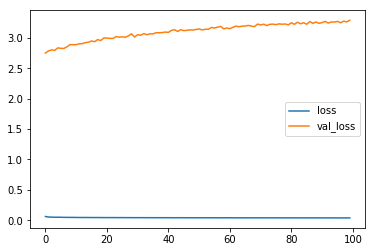

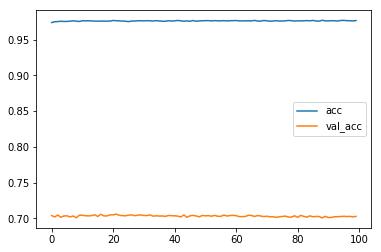

In [0]:
# Compile the model and train it
model.compile(
  optimizer='rmsprop',
  loss='categorical_crossentropy',
  metrics=['accuracy']
)

#es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)


r = model.fit(
  [encoder_inputs, decoder_inputs], decoder_targets_one_hot,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  validation_split=0.2,
  callbacks=[mc]
)

# plot some data
plt.plot(r.history['loss'], label='loss')
plt.plot(r.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

# accuracies
plt.plot(r.history['acc'], label='acc')
plt.plot(r.history['val_acc'], label='val_acc')
plt.legend()
plt.show()

# Save model
model.save('s2s.h5')



In [0]:
encoder_model = Model(encoder_inputs_placeholder, encoder_states)

decoder_state_input_h = Input(shape=(LATENT_DIM,))
decoder_state_input_c = Input(shape=(LATENT_DIM,))
decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]
# decoder_states_inputs = [decoder_state_input_h] # gru

decoder_inputs_single = Input(shape=(1,))
decoder_inputs_single_x = decoder_embedding(decoder_inputs_single)

# this time, we want to keep the states too, to be output
# by our sampling model
decoder_outputs, h, c = decoder_lstm(
  decoder_inputs_single_x,
  initial_state=decoder_states_inputs
)
# decoder_outputs, state_h = decoder_lstm(
#   decoder_inputs_single_x,
#   initial_state=decoder_states_inputs
# ) #gru
decoder_states = [h, c]
# decoder_states = [h] # gru
decoder_outputs = decoder_dense(decoder_outputs)

# The sampling model
# inputs: y(t-1), h(t-1), c(t-1)
# outputs: y(t), h(t), c(t)
decoder_model = Model(
  [decoder_inputs_single] + decoder_states_inputs, 
  [decoder_outputs] + decoder_states
)

# map indexes back into real words
# so we can view the results
idx2word_eng = {v:k for k, v in word2idx_inputs.items()}
idx2word_trans = {v:k for k, v in word2idx_outputs.items()}


def decode_sequence(input_seq):
  # Encode the input as state vectors.
  states_value = encoder_model.predict(input_seq)

  # Generate empty target sequence of length 1.
  target_seq = np.zeros((1, 1))

  # Populate the first character of target sequence with the start character.
  # NOTE: tokenizer lower-cases all words
  target_seq[0, 0] = word2idx_outputs['<sos>']

  # if we get this we break
  eos = word2idx_outputs['<eos>']

  # Create the translation
  output_sentence = []
  for _ in range(max_len_target):
    output_tokens, h, c = decoder_model.predict(
      [target_seq] + states_value
    )
    # output_tokens, h = decoder_model.predict(
    #     [target_seq] + states_value
    # ) # gru

    # Get next word
    idx = np.argmax(output_tokens[0, 0, :])

    # End sentence of EOS
    if eos == idx:
      break

    word = ''
    if idx > 0:
      word = idx2word_trans[idx]
      output_sentence.append(word)

    # Update the decoder input
    # which is just the word just generated
    target_seq[0, 0] = idx

    # Update states
    states_value = [h, c]
    # states_value = [h] # gru

  return ' '.join(output_sentence)



while True:
  # Do some test translations
  i = np.random.choice(len(input_texts))
  input_seq = encoder_inputs[i:i+1]
  translation = decode_sequence(input_seq)
  print('-')
  print('Input:', input_texts[i])
  print('Translation:', translation)


-
Input: To me, it's important.
Translation: আমার কাছে এটা গুরূত্বপুর্ণ।
-
Input: Do you live here?
Translation: আপনারা কি এখানে থাকেন?
-
Input: Tom insulted Mary.
Translation: টম মেরিকে অপমান করলো।
-
Input: He came.
Translation: ও এসেছিলো।
-
Input: I'm still your friend.
Translation: আমি এখনো আপনার বন্ধু আছি।
-
Input: Tom will scream.
Translation: টম চিৎকার করবে।
-
Input: You may speak.
Translation: আপনি কথা বলতে পারেন।
-
Input: Some of my friends can speak French well.
Translation: আমার খালি একটু ভালো খালি কথা খান।
-
Input: This is the only alternative.
Translation: এটাই একমাত্র বিকল্প।
-
Input: Your time is up.
Translation: আপনার সময় শেষ।
-
Input: I only have one blanket.
Translation: আমার কাছে মাত্র একটাই কম্বল আছে।
-
Input: May I swim in this lake?
Translation: আমি কি এই হ্রদে সাঁতার কাটতে পারি?
-
Input: Tom will speak.
Translation: টম কথা বলবে।
-
Input: Some people started laughing.
Translation: কিছু লোক হাসতে শুরু করলো।
-
Input: I don't know if I'll have time to do it.
Translati

In [0]:
y